# Handcrafted models
This notebook explores how far you can get with a simple model using good features.
Features are handpicked based on feature_engineerging_v2 and features_tsfresh.

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import gc
import numpy as np
from matplotlib import pyplot as plt
from tqdm.notebook import tqdm
import seaborn as sns
import plotly.express as px
from tqdm.notebook import tqdm

## Load data with selected features

In [2]:
features_long_timescale = [
    'abs_diff_clip_anglez_skew_1000', 'abs_diff_clip_anglez_mean_1000', 'abs_diff_clip_anglez_kurt_1000', 'abs_diff_anglez_kurt_1000', 'abs_diff_clip_anglez_skew_360', 'abs_diff_clip_anglez_median_360', 'enmo_mean_1000', 'enmo_std_360', 'abs_diff_clip_anglez_std_360', 'enmo_mean_360', 'enmo_max_1000', 'hour_stat', 'abs_diff_clip_anglez_median_12', 'abs_diff_clip_anglez_min_12', 'abs_diff_anglez_skew_360', 'enmo_std_12', 'abs_diff_anglez_std_360', 'abs_diff_clip_anglez', 'abs_diff_anglez', 'enmo_median_1000', 'sin_anglez_std_12', 'abs_diff_clip_anglez_max_12', 'abs_diff_anglez_max_12', 'enmo_mean_12', 'abs_diff_clip_anglez_min_360', 'enmo', 'hour', 'abs_diff_clip_anglez_skew_12', 'abs_diff_clip_anglez_min_1000', 'enmo_skew_12', 'sin_anglez_min_360', 'enmo_min_12', 'sin_anglez_min_1000', 'sin_anglez_std_1000', 'abs_diff_anglez_max_360', 'enmo_kurt_360', 'abs_diff_anglez_kurt_12', 'sin_anglez_min_12', 'enmo_skew_360', 'enmo_kurt_1000', 'sin_anglez_max_12', 'sin_anglez_max_360', 'abs_diff_anglez_skew_12', 'abs_diff_clip_anglez_max_360', 'abs_diff_anglez_max_1000', 'sin_anglez_std_360', 'sin_anglez_skew_12', 'sin_anglez_median_1000', 'enmo_kurt_12', 'sin_anglez_median_360', 'sin_anglez_max_1000', 'sin_anglez_mean_12', 'abs_diff_clip_anglez_max_1000', 'abs_diff_anglez_kurt_360', 'sin_anglez_skew_1000', 'minute', 'sin_anglez_kurt_360', 'enmo_min_1000', 'enmo_min_360', 'sin_anglez_skew_360', 'sin_anglez_kurt_1000', 'abs_diff_clip_anglez_kurt_12'
] 

features_short_timescale = [
    'abs_diff_clip_anglez_mean_12', 'abs_diff_anglez_max_12', 'abs_diff_clip_anglez_max_12', 'enmo_std_12', 'abs_diff_clip_anglez_median_360', 'abs_diff_anglez_median_12', 'abs_diff_clip_anglez_mean_360', 'abs_diff_clip_anglez_skew_360', 'abs_diff_anglez', 'abs_diff_clip_anglez_kurt_360', 'enmo_mean_12', 'abs_diff_anglez_median_1000', 'abs_diff_clip_anglez_min_12', 'abs_diff_anglez_kurt_360', 'enmo', 'abs_diff_anglez_std_360', 'enmo_mean_360', 'enmo_skew_12', 'enmo_median_360', 'abs_diff_clip_anglez_mean_1000', 'enmo_std_360', 'sin_anglez_kurt_360', 'abs_diff_clip_anglez_skew_1000', 'abs_diff_clip_anglez_kurt_1000', 'enmo_skew_360', 'abs_diff_anglez_kurt_12', 'sin_anglez_min_12', 'enmo_max_360', 'abs_diff_anglez_kurt_1000', 'abs_diff_clip_anglez_skew_12', 'enmo_median_1000', 'sin_anglez_std_360', 'sin_anglez_max_12', 'abs_diff_anglez_std_1000', 'enmo_mean_1000', 'abs_diff_anglez_max_360', 'enmo_min_12', 'sin_anglez_min_360', 'sin_anglez_max_360', 'enmo_std_1000', 'enmo_max_1000', 'sin_anglez_kurt_1000', 'hour_stat', 'enmo_skew_1000', 'enmo_min_360', 'sin_anglez', 'hour', 'sin_anglez_skew_12', 'sin_anglez_min_1000', 'sin_anglez_max_1000', 'abs_diff_clip_anglez_kurt_12', 'sin_anglez_median_360', 'abs_diff_anglez_max_1000', 'sin_anglez_std_1000', 'sin_anglez_median_1000', 'abs_diff_clip_anglez_max_360', 'enmo_min_1000', 'abs_diff_anglez_min_1000', 'abs_diff_anglez_min_360', 'sin_anglez_skew_1000', 'minute', 'sin_anglez_skew_360', 'enmo_kurt_12'
]

In [3]:
info_columns = ['series_id', 'target']
my_selection = [
    'abs_diff_clip_anglez_skew_1000', # best auroc for long timescale
    'abs_diff_clip_anglez_mean_1000', 
    'enmo_mean_1000',
    
    'abs_diff_clip_anglez_mean_12', # best auroc for short timescale    
    'abs_diff_clip_anglez_median_360', # most important feature for short timescale
    'sin_anglez_median_360', # 2nd most important feature for short timescale
    'abs_diff_anglez_max_12',
    'enmo_std_12',
    
    # others
    'hour_stat',
    'minute'
]

In [4]:
data = pd.read_parquet('../../../data/processed/Zzzs_train_features.parquet', columns=info_columns+my_selection)

KeyboardInterrupt: 

In [8]:
# convert each fp64 column to float32
cols_64 = data.select_dtypes('float64').columns
for col in cols_64:
    data[col] = data[col].astype('float32')
gc.collect()

40

In [9]:
data.head(10)

,series_id,target,abs_diff_clip_anglez_skew_1000,abs_diff_clip_anglez_mean_1000,enmo_mean_1000,abs_diff_clip_anglez_mean_12,abs_diff_clip_anglez_median_360,sin_anglez_median_360,abs_diff_anglez_max_12,enmo_std_12,hour_stat,minute
0,08db4255286f,1,1.360219,1.858507,0.075354,1.387191,1.451798,-0.463476,4.412199,0.019242,0.959695,0
1,08db4255286f,1,1.360219,1.858507,0.075354,1.387191,1.451798,-0.463476,4.412199,0.019242,0.959695,0
2,08db4255286f,1,1.360219,1.858507,0.075354,1.387191,1.451798,-0.463476,4.412199,0.019242,0.959695,0
3,08db4255286f,1,1.360219,1.858507,0.075354,1.387191,1.451798,-0.463476,4.412199,0.019242,0.959695,0
4,08db4255286f,1,1.360219,1.858507,0.075354,1.387191,1.451798,-0.463476,4.412199,0.019242,0.959695,0
5,08db4255286f,1,1.360219,1.858507,0.075354,1.387191,1.451798,-0.463476,4.412199,0.019242,0.959695,0
6,08db4255286f,1,1.360219,1.858507,0.075354,1.387191,1.451798,-0.463476,4.412199,0.019242,0.959695,0
7,08db4255286f,1,1.360219,1.858507,0.075354,1.573966,1.451798,-0.463476,4.412199,0.018462,0.959695,0
8,08db4255286f,1,1.360219,1.858507,0.075354,1.361925,1.451798,-0.463476,4.412199,0.017542,0.959695,0
9,08db4255286f,1,1.360219,1.858507,0.075354,1.451058,1.451798,-0.463476,4.412199,0.017658,0.959695,0


## Transform features with a logistic regression prediction

In [10]:
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import LogisticRegression

transformed_features = []
for feature in tqdm(my_selection):
    x = data[[feature]]
    y = data.target
    
    clf = LogisticRegression(random_state=0)
    clf.fit(x, y)
    
    preds = clf.predict_proba(x)[:, 1]
    auroc = roc_auc_score(y, preds)
    print(f'{feature}: {auroc}')
    if auroc > 0.7:
        name = feature+'_logres_pred'
        data[name] = preds
        transformed_features.append(name)
    gc.collect()

abs_diff_clip_anglez_skew_1000: 0.9897042305972259
abs_diff_clip_anglez_mean_1000: 0.9897906749624402
enmo_mean_1000: 0.9683874572226683
abs_diff_clip_anglez_mean_12: 0.9535630054410761
abs_diff_clip_anglez_median_360: 0.9784204796734574
sin_anglez_median_360: 0.542860579088207
abs_diff_anglez_max_12: 0.9131536866568979
enmo_std_12: 0.9309686808220439
hour_stat: 0.9538928677046852
minute: 0.5000164907065726


## Plot the transformed features and the target

In [11]:
# plot with plotly
display_days = 5
subsample = 10
display_set = data[:display_days*17280:subsample]
fig = px.line(display_set, x=range(len(display_set)), y=transformed_features+['target'])
fig.show()

# Train a model on the transformed features

In [103]:
# make split
X = data[my_selection+transformed_features]
y = data.target

test_size = 0.2
sids = data.series_id.unique()
train_sids = sids[:int(len(sids)*(1-test_size))]
train_mask = data.series_id.isin(train_sids)

X_train = X[train_mask]
y_train = y[train_mask]
X_test = X[~train_mask]
y_test = y[~train_mask]

In [12]:
gc.collect()

40

In [105]:
# train a catboost model with eval set and early stopping
from catboost import CatBoostClassifier
from sklearn.metrics import roc_auc_score

clf = CatBoostClassifier(iterations=1000, eval_metric='AUC', early_stopping_rounds=5, verbose=True)
clf.fit(X_train, y_train, eval_set=(X_test, y_test))

preds = clf.predict_proba(X_test)[:, 1]
auroc = roc_auc_score(y_test, preds)
print(f'AUROC: {auroc}')

Learning rate set to 0.313191
0:	test: 0.9932929	best: 0.9932929 (0)	total: 5.81s	remaining: 1h 36m 47s
1:	test: 0.9951161	best: 0.9951161 (1)	total: 7.44s	remaining: 1h 1m 51s
2:	test: 0.9954301	best: 0.9954301 (2)	total: 8.94s	remaining: 49m 30s
3:	test: 0.9954452	best: 0.9954452 (3)	total: 10.3s	remaining: 42m 46s
4:	test: 0.9956657	best: 0.9956657 (4)	total: 11.6s	remaining: 38m 32s
5:	test: 0.9956523	best: 0.9956657 (4)	total: 13.1s	remaining: 36m 16s
6:	test: 0.9956429	best: 0.9956657 (4)	total: 14.5s	remaining: 34m 21s
7:	test: 0.9958332	best: 0.9958332 (7)	total: 16s	remaining: 33m
8:	test: 0.9959611	best: 0.9959611 (8)	total: 17.5s	remaining: 32m 3s
9:	test: 0.9961036	best: 0.9961036 (9)	total: 18.7s	remaining: 30m 50s
10:	test: 0.9961177	best: 0.9961177 (10)	total: 20s	remaining: 29m 55s
11:	test: 0.9960008	best: 0.9961177 (10)	total: 21.4s	remaining: 29m 19s
12:	test: 0.9958799	best: 0.9961177 (10)	total: 22.7s	remaining: 28m 45s
13:	test: 0.9959396	best: 0.9961177 (10)	tota

In [99]:
# feature importances bar chart
feature_importances = pd.DataFrame({'feature': X_train.columns, 'importance': clf.feature_importances_})
feature_importances = feature_importances.sort_values('importance', ascending=False)
feature_importances['importance'] /= feature_importances['importance'].sum()

fig = px.bar(feature_importances, x='importance', y='feature', orientation='h')
fig.show()

# Plot predictions

In [32]:
# plot with plotly detailed
display_days = 5
subsample = 1
df = pd.DataFrame({'preds': preds, 'target': y_test})
df_display = df[:display_days*17280:subsample]
fig = px.line(df_display, x=range(len(df_display)), y=['preds', 'target'])
fig.write_html('handcrafted_model_viz_detailed.html')

# plot overview
display_days = 100
subsample = 90
df = pd.DataFrame({'preds': preds, 'target': y_test})
df_display = df[:display_days*17280:subsample]
fig = px.line(df_display, x=range(len(df_display)), y=['preds', 'target'])
fig.write_html('handcrafted_model_viz_overview.html')

# State to event
To go from event segmentation to state segmentation, we will find the median curve around both onset and wakeup events.
Given a new prediction, we shift this across the window with stride of 12, and measure the distance to the median curve, the similarity shows the likelihood of the event.

In [109]:
# make preds for all data, both train and test
preds = clf.predict_proba(X)[:, 1]

In [110]:
# find transitions in the target column (1=awake, 0=asleep)
diff = data.target.diff()
wakeups = diff[diff==1].index
onsets = diff[diff==-1].index

In [117]:
# find the median curve of preds around each transition
window_size = 720

wakeup_curves = np.empty((len(wakeups), window_size))
for i, wakeup in enumerate(wakeups):
    left = wakeup - window_size//2
    right = wakeup + window_size//2
    wakeup_curves[i] = preds[left:right]
    
median_curve = np.median(wakeup_curves, axis=0)
mean_curve = np.mean(wakeup_curves, axis=0)

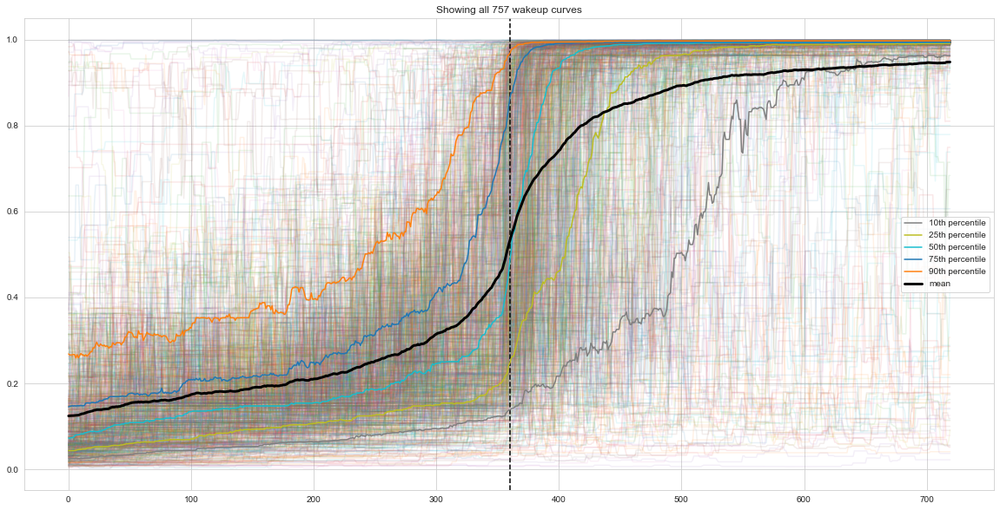

In [118]:
# plot all the curves over each other
plt.figure(figsize=(20, 10))
plt.plot(wakeup_curves.T, alpha=0.1)
plt.title(f"Showing all {len(wakeups)} wakeup curves")
plt.axvline(window_size//2, color='black', linestyle='--')

# plot percentiles
for percentile in [10, 25, 50, 75, 90]:
    plt.plot(np.percentile(wakeup_curves, percentile, axis=0), label=f'{percentile}th percentile')

# plot mean
plt.plot(wakeup_curves.mean(axis=0), label='mean', color='black', linewidth=3)

plt.legend()
plt.show()

Let's show the response on a test series

In [121]:
limit = 500000
display_data = X_test[:limit]

display_preds = clf.predict_proba(display_data)[:, 1]

# normalize preds and median curve with std and mean
template = mean_curve
template = template - template.mean()
display_preds = display_preds - template.mean()

result = np.correlate(display_preds, template, mode='valid')
result = np.pad(result, (window_size//2-1, window_size//2), 'constant', constant_values=0)
result = result / result.max()
result = result.clip(0, 1)

In [124]:
# Plot the results
plot_df = pd.DataFrame({'preds': display_preds, 'result': result})
plot_df = plot_df[::12]
fig = px.line(plot_df, y=['preds', 'result'])

display_y = y_test[:limit].reset_index(drop=True)
display_wakeups = display_y[display_y.diff()==1].index
for display_wakeup in display_wakeups:
    fig.add_vline(x=display_wakeup, line_width=1, line_dash="dash", line_color="green")
fig.show()